## Importing the necessary libraries

In [5]:
import re
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from wordcloud import WordCloud,STOPWORDS
from collections import Counter
import plotly.graph_objects as go
from sklearn.manifold import TSNE
import plotly.express as px
from helper import clean_text,trim_sentence,read_data_file_data_file
import json
import config
from helper import read_data_file
# from PIL import Image
# from textblob import TextBlob
# from nltk.stem import 	WordNetLemmatizer
# wordnet_lemmatizer = WordNetLemmatizer()
# from nltk.corpus import stopwords
# stops=set(stopwords.words('english'))


## Congfiguration

In [3]:
# class config:
#     base_dir = "/home/ravikumar/gdrive/DL_projects/text_classification/"
#     data_file_dir = "imdb_dataset.csv" 
#     map_dict = {'positive' : 1,'negative':0}
#     emb_vec_file = "dataset/prep_emb_vec.pkl"
#     MIN_COUNT = 4
#     TRIM_SIZE = 300

In [3]:
params = {k:v for k,v in config.__dict__.items() if "__" not in k}
params

{'runtime_name': 'base_bidi_lstm_seq_hidden_loss_sum_added_layer_dropout_0.5_relu,added_metrics',
 'device': 'cuda',
 'base_dir': 'Chapter - 1 : Coding a basic project/',
 'raw_dataset_file': 'dataset/imdb_dataset.csv',
 'preprocessed_dataset_file': 'dataset/preprocessed_dataset.csv',
 'mapping': {'negative': 0, 'positive': 1},
 'vocab_file_name': 'dataset/vocab.json',
 'save_checkpoint_dir': 'Chapter - 1 : Coding a basic project/trained_models/',
 'train_test_data_file': 'dataset/train_test_vocabed.pkl',
 'MIN_COUNT': 4,
 'TRIM_SIZE': 300,
 'weight_decay': 1e-05,
 'target_columns': ['sentiment'],
 'input_column': ['trimmed_review'],
 'max_seq_len': 300,
 'BATCH_SIZE': 16,
 'LEARNING_RATE': 0.001,
 'EPOCHS': 100,
 'EMBED_SIZE': 32,
 'HIDDEN_SIZE': 16,
 'OUT_DIM': 16,
 'n_labels': 1,
 'patience': 5,
 'debug_mode': False}

## Import data

In [10]:
dataset = pd.read_csv(params['base_dir'],params['raw_dataset_file'])

/home/ravikumar/miniconda3/envs/base_pytorch/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3398: FutureWarning: In a future version of pandas all arguments of read_csv except for the argument 'filepath_or_buffer' will be keyword-only.
  exec(code_obj, self.user_global_ns, self.user_ns)
/tmp/ipykernel_186377/481808827.py:1: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  dataset = pd.read_csv(params['base_dir'],params['raw_dataset_file'])


FileNotFoundError: [Errno 2] No such file or directory: 'Chapter - 1 : Coding a basic project/'

## Sample dataset

In [ ]:
pd.set_option('max_colwidth', 400)
dataset.head()

In [ ]:
dataset['review'].iloc[0]

In [ ]:
print(f"Number of Rows    : {dataset.shape[0]}\nNumber of Columns : {dataset.shape[1]}")

## Stastics on dataset

In [9]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   review     50000 non-null  object
 1   sentiment  50000 non-null  object
dtypes: object(2)
memory usage: 781.4+ KB


There are two columns, review and sentiment, with samples 5000.

In [10]:
dataset.describe()

,review,sentiment
count,50000,50000
unique,49582,2
top,"Loved today's show!!! It was a variety and not solely cooking (which would have been great too). Very stimulating and captivating, always keeping the viewer peeking around the corner to see what was coming up next. She is as down to earth and as personable as you get, like one of us which made the show all the more enjoyable. Special guests, who are friends as well made for a nice surprise too...",positive
freq,5,25000


By observation, there are 50k counts/samples, have two unique labels/classes (postive/negative).

there are 5 samples frequently occured, which means, repeated reviews. Let's see them,

In [11]:
review_text,num_count = Counter(dataset.review).most_common(3)[0]

In [12]:
print(f"Below text repeated {num_count} times.\n\n {review_text}")

Below text repeated 5 times.

 Loved today's show!!! It was a variety and not solely cooking (which would have been great too). Very stimulating and captivating, always keeping the viewer peeking around the corner to see what was coming up next. She is as down to earth and as personable as you get, like one of us which made the show all the more enjoyable. Special guests, who are friends as well made for a nice surprise too. Loved the 'first' theme and that the audience was invited to play along too. I must admit I was shocked to see her come in under her time limits on a few things, but she did it and by golly I'll be writing those recipes down. Saving time in the kitchen means more time with family. Those who haven't tuned in yet, find out what channel and the time, I assure you that you won't be disappointed.


In [13]:
for cout in Counter(dataset.review).most_common(3):
    print(f"Below text repeated {cout[1]} times. \n\n {cout[0]}\n")
    print("="*110)

Below text repeated 5 times. 

 Loved today's show!!! It was a variety and not solely cooking (which would have been great too). Very stimulating and captivating, always keeping the viewer peeking around the corner to see what was coming up next. She is as down to earth and as personable as you get, like one of us which made the show all the more enjoyable. Special guests, who are friends as well made for a nice surprise too. Loved the 'first' theme and that the audience was invited to play along too. I must admit I was shocked to see her come in under her time limits on a few things, but she did it and by golly I'll be writing those recipes down. Saving time in the kitchen means more time with family. Those who haven't tuned in yet, find out what channel and the time, I assure you that you won't be disappointed.

Below text repeated 4 times. 

 Hilarious, clean, light-hearted, and quote-worthy. What else can you ask for in a film? This is my all-time, number one favorite movie. Ever s

In [ ]:
max_rep = max(list(Counter(dataset.review).values()))
print(f"Maximum times repeated  {max_rep}")

we can see the review are duplicated.

In [ ]:
dataset.drop_duplicates(['review','sentiment'],inplace=True)

In [ ]:
print(f"Number of Rows    : {dataset.shape[0]}\nNumber of Columns : {dataset.shape[1]}")

## missing values

In [17]:
dataset.isnull().sum()

review       0
sentiment    0
dtype: int64

## Sentiment class counts

In [26]:
fig = px.histogram(dataset, x="sentiment",
                   color = 'sentiment',
                  title = 'Number of reviews per classes',
                  text_auto=True,
                  )
fig.show()

Above graph shows us distribution is 24.88k and 24.69K, for class postive and negative, respectively.

#### Are there any words follows with # tags?

In [18]:
taged_words_len = len(dataset.review.str.extractall(r'(\#\w+)')[0].value_counts())
print(f"There are {taged_words_len} # taged words")

There are 83 # taged words


In [30]:
tag_data = dataset.review.str.extractall(r'(\#\w+)')[0][:40]
fig = px.histogram(x = tag_data,
            color = tag_data.tolist(),
            labels = {'x' : "tag words"},
            title = 'Words follws with # tags',
            )
fig.show()

In [36]:
# Counter(corpus).most_common()

## Positive Review Text

### Representing text data in which the size of each word indicates its frequency

In [19]:
dataset['sentiment'] = dataset['sentiment'].map(params['mapping'])

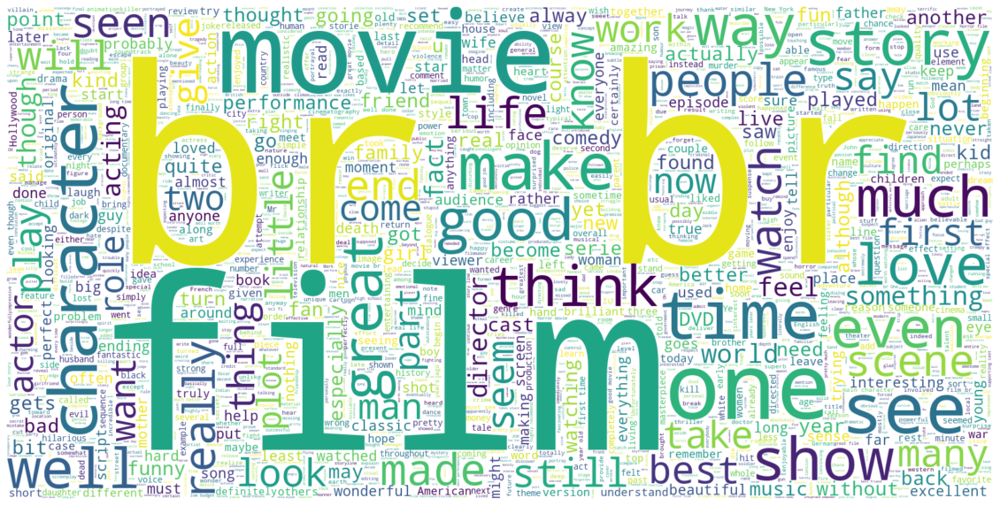

In [62]:
plt.figure(figsize = (20,20)) # Positive Review Text
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800, background_color="white").generate(" ".join(dataset[dataset.sentiment == 1].review))
plt.imshow(wc , interpolation = 'bilinear')
plt.axis("off")
plt.show()

## Negative Review Text

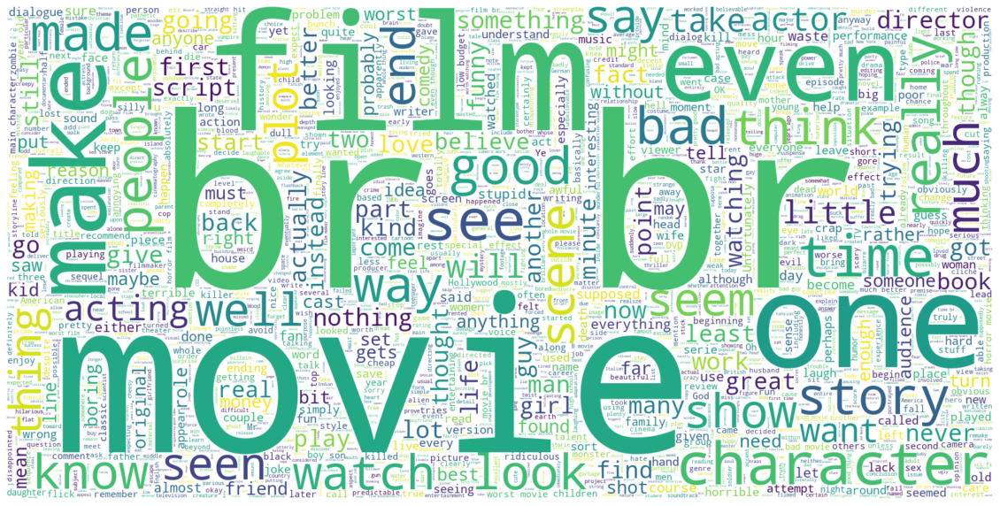

In [63]:
plt.figure(figsize = (20,20)) # Positive Review Text
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800,background_color="white").generate(" ".join(dataset[dataset.sentiment == 0].review))
plt.imshow(wc , interpolation = 'bilinear')
plt.axis("off")
plt.show()

In [20]:
review_len = [len(text.split()) for text in dataset.review]
dataset['review_len'] = review_len

In [238]:
fig = px.histogram(dataset,x = 'review_len')
fig.show()

## Preprocessing text

In [21]:
dataset.review = dataset.review.apply(lambda x : clean_text(x))
trimed_sentence = trim_sentence(dataset.review)
dataset['trimmed_review'] = trimed_sentence

### min word len size review

In [24]:
df = dataset[dataset['review_len'] == min(review_len)]
print(f"min word review length is {list(df['review_len'])[0]}")

min word review length is 4


### max word len size review

In [25]:
df = dataset[dataset['review_len'] == max(review_len)]
print(f"Max word review length is {list(df['review_len'])[0]}")

Max word review length is 2470


In [26]:
df = dataset[dataset['review_len'] == min(review_len)]
# print(f"min word review length is {list(df['review_len'])[0]}")

In [27]:
dataset['review_len'].describe()

count    49582.000000
mean       231.350167
std        171.542020
min          4.000000
25%        126.000000
50%        173.000000
75%        281.000000
max       2470.000000
Name: review_len, dtype: float64

In [28]:
dataset[dataset['review_len'] < 10]

,review,sentiment,review_len,trimmed_review
13109,more suspenseful more subtle much much more disturbing,0,8,more suspenseful more subtle much much more disturbing
27521,read the book forget the movie,0,6,read the book forget the movie
28920,primary plot primary direction poor interpretation,0,4,primary plot primary direction poor interpretation
31072,what a script what a story what a mess,0,9,what a script what a story what a mess
40817,i hope this group of film maker never re unites,0,8,i hope this group of film maker never re unites


In [29]:
dataset[dataset['review_len'] < 300].shape

(38439, 4)

In [16]:
fig = px.bar(x =words,y =word_counts,
             color = words,
             title = 'most common 100 words count',
             hover_name=words,
            labels = {'x':"words",'y':"word counts"})
fig.show()

## Average word length in text (positive and negative review)

In [17]:
word_positive =dataset[dataset['sentiment']==1]['review'].str.split().apply(lambda x : [len(i) for i in x])
word_positive = word_positive.map(lambda x: np.mean(x))
word_negative =dataset[dataset['sentiment']==0]['review'].str.split().apply(lambda x : [len(i) for i in x])
word_negative = word_negative.map(lambda x: np.mean(x))

In [18]:
fig = px.histogram(word_positive,
                  marginal = 'box',
                  labels = {'value' : 'reviews'},
                  title = "Average word length in text (Positive Review)",
                  height=500,width = 1000,
                  )
fig.show()

In [19]:
fig = px.histogram(word_negative,
                  marginal = 'box',
                  labels = {'value' : 'reviews'},
                  title = "Average word length in each text (Negative Review)",
                  height=500,width = 1000,
                  color_discrete_sequence=['indianred'],
                  )
fig.show()

In [20]:

fig = go.Figure()
fig.add_trace(go.Histogram(x=word_positive,
                          name = 'Positive review',
                          marker_color = '#00FF00',
                          opacity=0.75))
fig.add_trace(go.Histogram(x=word_negative,
                          name = 'Negative review',
                          marker_color = '#FF0000',
                          opacity=0.75))

fig.update_layout(title_text = "Average word length in a both classes",
                  xaxis_title_text = 'reviews',
                  yaxis_title_text = 'Count',
                  barmode='stack')
fig.show()

In [64]:
from tqdm.notebook import tqdm

vocab = set()
for sentence in tqdm(dataset['trimmed_review']):
    for word in sentence.split():
        vocab.add(word)
word2index = {'PAD' : 0,'SOS':1,'EOS':2,'UNK':3}
index2word = {0:'PAD',1:'SOS',2:'EOS',3 : 'UNK'}
        
for idx,word in enumerate(vocab,start = 4):
    word2index[word] = idx
    index2word[idx] = word       

# tokens = list()
# for sentence in tqdm(dataset['trimmed_review']):
#     token_sentence = list()
#     for word in sentence.split():
#         token_sentence.append(word2index[word])
#     tokens.append(token_sentence)
        

  0%|          | 0/49582 [00:00<?, ?it/s]

  0%|          | 0/49582 [00:00<?, ?it/s]

In [73]:
json.dump(
    {
      "word2index" : word2index,
      "index2word" : index2word
    },
    open(config.vocab_file_name,"w")) 

In [77]:
sentence_len = list()
for sentence in dataset['trimmed_review']:
    sentence_len.append(len(sentence.split()))      
dataset['review_len'] = sentence_len

In [78]:
dataset

,review,sentiment,review_len,trimmed_review
0,one of the other reviewer ha mentioned that after watching just oz episode you ll be hooked they are right a this is exactly what happened with me the first thing that struck me about oz wa it utality and unflinching scene of violence which set in right from the word go trust me this is not a show for the faint hearted or timid this show pull no punch with regard to drug sex or violence its is...,1,300,one of the other reviewer ha mentioned that after watching just oz episode you ll be hooked they are right a this is exactly what happened with me the first thing that struck me about oz wa it utality and unflinching scene of violence which set in right from the word go trust me this is not a show for the faint hearted or timid this show pull no punch with regard to drug sex or violence its is...
1,a wonderful little production the filming technique is very unassuming very old time bbc fashion and give a comforting and sometimes discomforting sense of realism to the entire piece the actor are extremely well chosen michael sheen not only ha got all the polari but he ha all the voice down pat too you can truly see the seamless editing guided by the reference to williams diary entry not onl...,1,160,a wonderful little production the filming technique is very unassuming very old time bbc fashion and give a comforting and sometimes discomforting sense of realism to the entire piece the actor are extremely well chosen michael sheen not only ha got all the polari but he ha all the voice down pat too you can truly see the seamless editing guided by the reference to williams diary entry not onl...
2,i thought this wa a wonderful way to spend time on a too hot summer weekend sitting in the air conditioned theater and watching a light hearted comedy the plot is simplistic but the dialogue is witty and the character are likable even the well ead suspected serial killer while some may be disappointed when they realize this is not match point risk addiction i thought it wa proof that woody all...,1,167,i thought this wa a wonderful way to spend time on a too hot summer weekend sitting in the air conditioned theater and watching a light hearted comedy the plot is simplistic but the dialogue is witty and the character are likable even the well ead suspected serial killer while some may be disappointed when they realize this is not match point risk addiction i thought it wa proof that woody all...
3,basically there s a family where a little boy jake think there s a zombie in his closet his parent are fighting all the time this movie is slower than a soap opera and suddenly jake decides to become rambo and kill the zombie ok first of all when you re going to make a film you must decide if it a thriller or a drama as a drama the movie is watchable parents are divorcing arguing like in real ...,0,133,basically there s a family where a little boy jake think there s a zombie in his closet his parent are fighting all the time this movie is slower than a soap opera and suddenly jake decides to become rambo and kill the zombie ok first of all when you re going to make a film you must decide if it a thriller or a drama as a drama the movie is watchable parents are divorcing arguing like in real ...
4,petter mattei s love in the time of money is a visually stunning film to watch mr mattei offer u a vivid portrait about human relation this is a movie that seems to be telling u what money power and success do to people in the different situation we encounter this being a variation on the arthur schnitzler s play about the same theme the director transfer the action to the present time new yor...,1,228,petter mattei s love in the time of money is a visually stunning film to watch mr mattei offer u a vivid portrait about human relation this is a movie that seems to be telling u what money power and success do to people in the different situation we encounter this being a variation on the arthur schnitzler s play a

### Saving the dataframe as csv

In [79]:
df = dataset[['trimmed_review','sentiment','review_len']]

In [81]:
config.base_dir + config.preprocessed_dataset_file

'Chapter - 1 : Coding a basic project/dataset/preprocessed_dataset.csv'

In [82]:
df.to_csv(config.preprocessed_dataset_file,index = False)

In [84]:
pd.read_csv(config.preprocessed_dataset_file).head()

,trimmed_review,sentiment,review_len
0,one of the other reviewer ha mentioned that after watching just oz episode you ll be hooked they are right a this is exactly what happened with me the first thing that struck me about oz wa it utality and unflinching scene of violence which set in right from the word go trust me this is not a show for the faint hearted or timid this show pull no punch with regard to drug sex or violence its is...,1,300
1,a wonderful little production the filming technique is very unassuming very old time bbc fashion and give a comforting and sometimes discomforting sense of realism to the entire piece the actor are extremely well chosen michael sheen not only ha got all the polari but he ha all the voice down pat too you can truly see the seamless editing guided by the reference to williams diary entry not onl...,1,160
2,i thought this wa a wonderful way to spend time on a too hot summer weekend sitting in the air conditioned theater and watching a light hearted comedy the plot is simplistic but the dialogue is witty and the character are likable even the well ead suspected serial killer while some may be disappointed when they realize this is not match point risk addiction i thought it wa proof that woody all...,1,167
3,basically there s a family where a little boy jake think there s a zombie in his closet his parent are fighting all the time this movie is slower than a soap opera and suddenly jake decides to become rambo and kill the zombie ok first of all when you re going to make a film you must decide if it a thriller or a drama as a drama the movie is watchable parents are divorcing arguing like in real ...,0,133
4,petter mattei s love in the time of money is a visually stunning film to watch mr mattei offer u a vivid portrait about human relation this is a movie that seems to be telling u what money power and success do to people in the different situation we encounter this being a variation on the arthur schnitzler s play about the same theme the director transfer the action to the present time new yor...,1,228


In [11]:
import json

In [12]:
pwd

'/home/ravikumar/gdrive/DL_projects/Learning-NLP-with-PyTorch/Chapter - 1 : Coding a basic project'

In [16]:
vocabs = json.load(open("/home/ravikumar/gdrive/DL_projects/Learning-NLP-with-PyTorch/Chapter - 1 : Coding a basic project/dataset/vocab.json",'r'))

In [18]:
len(vocabs['word2index'])

86258

In [20]:
vocabs['vocab_len'] = len(vocabs['word2index'])

In [26]:
json.dump(
    {
      "word2index" : vocabs["word2index"],
      "index2word" : vocabs["index2word"],
      "vocab_len" : vocabs['vocab_len']
    },
    open('dataset/vocabs.json',"w")) 

In [24]:
config.vocab_file_name

'dataset/vocab.json'

In [25]:
pwd

'/home/ravikumar/gdrive/DL_projects/Learning-NLP-with-PyTorch/Chapter - 1 : Coding a basic project'